# Installation

In [ ]:
!pip install git+https://github.com/borongzhang/magpie_ptychography.git@main

# Imports

In [1]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import h5py
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import imageio.v2 as imageio
import random
import time
from magpie_ptychography.src import magpie_loop, rpie, lbfgs
from magpie_ptychography.src import feasibility_distance_misfit
from magpie_ptychography.src import generate_intensity_measurements, generate_scanning_positions


# Setup

In [2]:
# Size of the object
object_shape = (512, 512)

# Side length of the probe
n_probe = 128


## Realistic Synthetic Object and Probe

In [3]:
mat_data = scipy.io.loadmat('assets/recon_zoneplate_Yi.mat')
obj = mat_data['obj']
orgn_probe = mat_data['probe']

pad_x = (object_shape[0] - obj.shape[0]) // 2
pad_y = (object_shape[1] - obj.shape[1]) // 2

# Pad the object to the desired shape
real_object = np.pad(obj, ((pad_x, pad_x), (pad_y, pad_y)), mode='edge')

ratio = orgn_probe.shape[0] // n_probe

real_probe = orgn_probe[::ratio,::ratio]

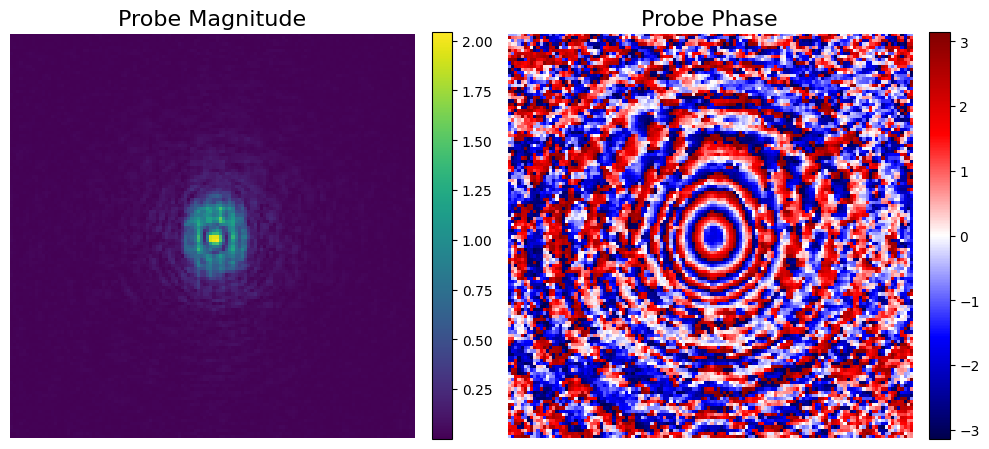

In [4]:
# Compute magnitude and phase
magnitude = np.abs(real_probe)
phase = np.angle(real_probe)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Probe Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='seismic')
ax.set_title('Probe Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('probe_mag_phase.png', dpi=120, bbox_inches='tight')
plt.show()

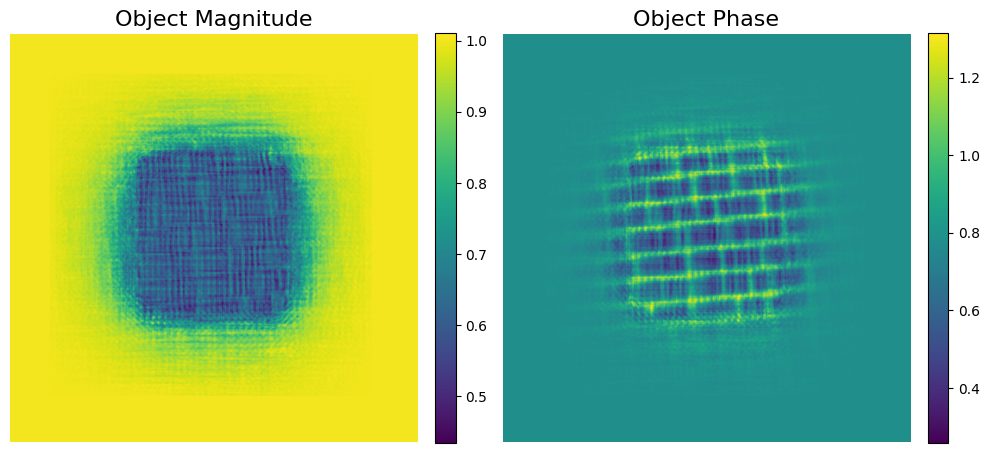

In [5]:
magnitude = np.abs(real_object)
phase = np.angle(real_object)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Object Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='viridis')
ax.set_title('Object Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('realistic_object.png', dpi=120, bbox_inches='tight')
plt.show()

## Data Generation

In [6]:
# Choose Object
probe = real_probe
ground_truth = real_object

# Probe shift for intensity measurement
shift_o50 = 64
shift_o75 = 32

# Define scanning positions
pos_array_o50 = generate_scanning_positions(object_shape, n_probe, shift_o50)
pos_array_o75 = generate_scanning_positions(object_shape, n_probe, shift_o75)

# Noise added to the measurement
noise_level = 0.05

# Generate the data
data_o50 = generate_intensity_measurements(ground_truth, probe, pos_array_o50, noise_level)
data_o75 = generate_intensity_measurements(ground_truth, probe, pos_array_o75, noise_level)


# Numerical examples

In [7]:
misfit = feasibility_distance_misfit
z_initial = np.ones_like(ground_truth)
num_iterations = 3000
alpha_rpie_o50 = 0.03
tol_o50 = 3e-5
alpha_rpie_o75 = 0.06
tol_o75 = 6e-5
print('The maximum level for MAGPIE is:', int(np.log2(probe.shape[0])))


The maximum level for MAGPIE is: 7


In [8]:
z_recon_rPIE_o50, res_rPIE_o50, errors_rPIE_o50, tol_rPIE_o50 = rpie(z_initial, probe, data_o50, pos_array_o50, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie_o50, metric = True, tol = tol_o50)


In [9]:
z_recon_rPIE_o75, res_rPIE_o75, errors_rPIE_o75, tol_rPIE_o75 = rpie(z_initial, probe, data_o75, pos_array_o75, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie_o75, metric = True, tol = tol_o75)


In [10]:
z_recon_MAGPIE_o50, res_MAGPIE_o50, errors_MAGPIE_o50, tol_MAGPIE_o50 = magpie_loop(z_initial, probe, data_o50, pos_array_o50, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie_o50, metric = True, tol = tol_o50, 
                                                   max_level = int(np.log2(probe.shape[0])))


In [11]:
z_recon_MAGPIE_o75, res_MAGPIE_o75, errors_MAGPIE_o75, tol_MAGPIE_o75 = magpie_loop(z_initial, probe, data_o75, pos_array_o75, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie_o75, metric = True, tol = tol_o75, 
                                                   max_level = int(np.log2(probe.shape[0])))


In [12]:
zstar_o50, eval_history_LBFGS_o50, tol_LBFGS_o50 = lbfgs(z_initial, probe, data_o50, pos_array_o50, 
                                                   num_iterations, misfit, ground_truth, tol = tol_o50)


In [13]:
zstar_o75, eval_history_LBFGS_o75, tol_LBFGS_o75 = lbfgs(z_initial, probe, data_o75, pos_array_o75, 
                                                   num_iterations, misfit, ground_truth, tol = tol_o75)


In [14]:
res_f_LBFGS_o75 = eval_history_LBFGS_o75['f']
errors_LBFGS_o75 = eval_history_LBFGS_o75['error']
res_f_LBFGS_o50 = eval_history_LBFGS_o50['f']
errors_LBFGS_o50 = eval_history_LBFGS_o50['error']

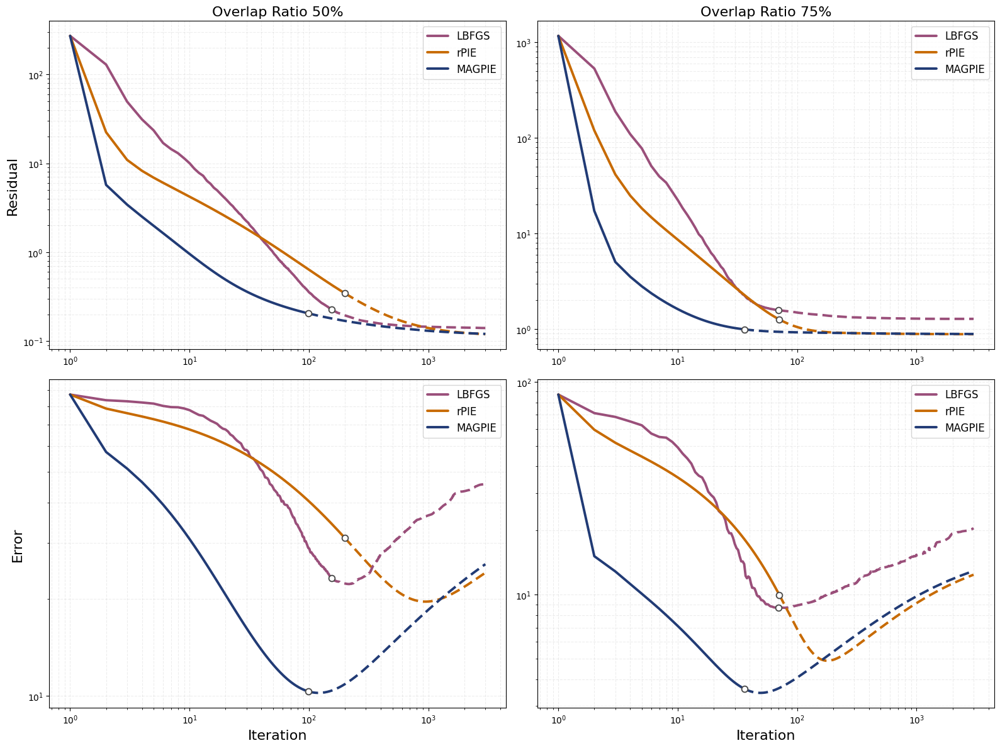

In [15]:
lbfgs_color = '#9A4F7A'
rpie_color  = '#C76A00'
magpie_color = '#213B75'

def plot_curve_with_tol(ax, values, tol_iter, label, color, lw=2.8):
    values = np.asarray(values)

    # x=1 is the initial point, x=j+1 corresponds to iteration j
    x = np.arange(1, len(values) + 1)
    y = values

    if len(x) == 0:
        return

    tol_x = None if tol_iter is None else int(tol_iter) + 1

    if tol_x is None or tol_x < 1 or tol_x > len(values):
        ax.plot(
            x, y,
            label=label,
            color=color,
            linewidth=lw,
            linestyle='-',
            solid_capstyle='round'
        )
        return

    mask_before = x <= tol_x
    mask_after  = x >= tol_x

    ax.plot(
        x[mask_before], y[mask_before],
        label=label,
        color=color,
        linewidth=lw,
        linestyle='-',
        solid_capstyle='round'
    )

    ax.plot(
        x[mask_after], y[mask_after],
        color=color,
        linewidth=lw,
        linestyle=(0, (4, 2)),
        solid_capstyle='round'
    )

    ax.plot(
        tol_x, y[tol_x - 1],
        marker='o',
        markersize=7.0,
        linestyle='None',
        markerfacecolor='white',
        markeredgecolor='#4A4A4A',
        markeredgewidth=1.35,
        zorder=10
    )

def plot_subfigure(ax,
                   values_lbfgs, values_rpie, values_magpie,
                   tol_lbfgs, tol_rpie, tol_magpie,
                   overlap_ratio=None,
                   xlabel=True, ylabel=False):
    plot_curve_with_tol(ax, values_lbfgs, tol_lbfgs, 'LBFGS',  lbfgs_color, lw=2.8)
    plot_curve_with_tol(ax, values_rpie,  tol_rpie,  'rPIE',   rpie_color,  lw=2.8)
    plot_curve_with_tol(ax, values_magpie, tol_magpie, 'MAGPIE', magpie_color, lw=2.8)

    if xlabel:
        ax.set_xlabel('Iteration', fontsize=16)

    if ylabel == 1:
        ax.set_ylabel('Residual', fontsize=16)
    elif ylabel == 2:
        ax.set_ylabel('Error', fontsize=16)

    if overlap_ratio is not None:
        ax.set_title(f'Overlap Ratio {overlap_ratio}%', fontsize=16)

    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid(True, which='both', linestyle='--', alpha=0.22)
    ax.legend(fontsize=12, frameon=True, loc='best')


fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

plot_subfigure(
    axes[0, 0],
    res_f_LBFGS_o50, res_rPIE_o50, res_MAGPIE_o50,
    tol_LBFGS_o50,   tol_rPIE_o50, tol_MAGPIE_o50,
    overlap_ratio=50,
    xlabel=False,
    ylabel=1
)

plot_subfigure(
    axes[0, 1],
    res_f_LBFGS_o75, res_rPIE_o75, res_MAGPIE_o75,
    tol_LBFGS_o75,   tol_rPIE_o75, tol_MAGPIE_o75,
    overlap_ratio=75,
    xlabel=False,
    ylabel=False
)

plot_subfigure(
    axes[1, 0],
    errors_LBFGS_o50, errors_rPIE_o50, errors_MAGPIE_o50,
    tol_LBFGS_o50,    tol_rPIE_o50,    tol_MAGPIE_o50,
    overlap_ratio=None,
    xlabel=True,
    ylabel=2
)

plot_subfigure(
    axes[1, 1],
    errors_LBFGS_o75, errors_rPIE_o75, errors_MAGPIE_o75,
    tol_LBFGS_o75,    tol_rPIE_o75,    tol_MAGPIE_o75,
    overlap_ratio=None,
    xlabel=True,
    ylabel=False
)

plt.tight_layout()
plt.savefig('metric_4.png', dpi=200, bbox_inches='tight')
plt.show()


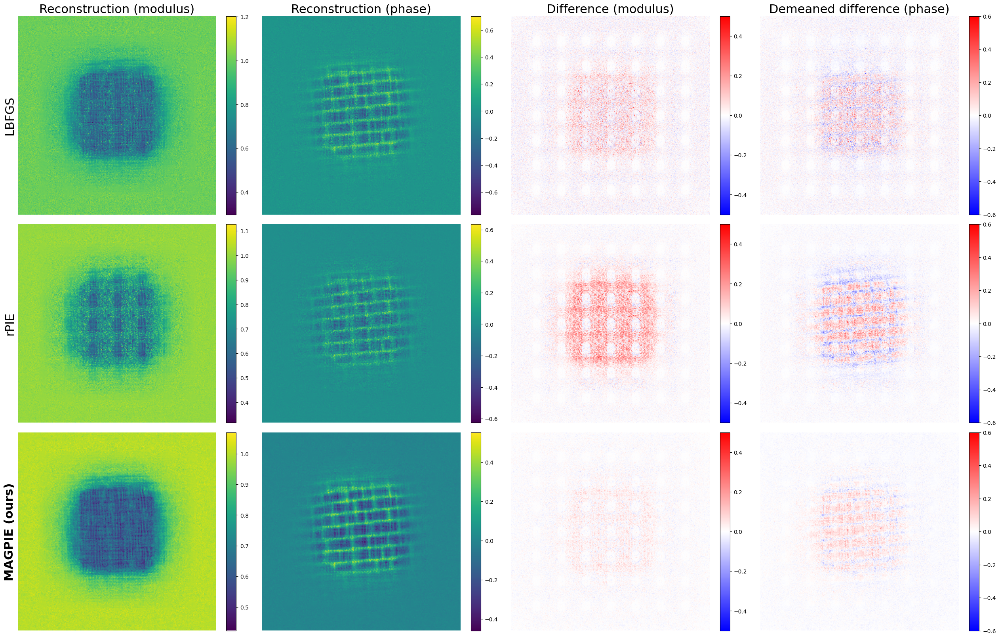

In [16]:
size = object_shape
rPIE_image = z_recon_rPIE_o50
MGrPIE_image = z_recon_MAGPIE_o50
LBFGS_image = zstar_o50.view(np.complex128).reshape(object_shape)
ground_truth = real_object

intensity_ground_truth = np.abs(ground_truth)
phase_ground_truth = np.angle(ground_truth)

def calculate_difference(image, ground_truth):
    intensity_diff = np.abs(image) - intensity_ground_truth
    phase_diff = np.angle(image) - phase_ground_truth - np.mean(np.angle(image) - phase_ground_truth)
    return intensity_diff, phase_diff

intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
intensity_MGrPIE, phase_MGrPIE = np.abs(MGrPIE_image), np.angle(MGrPIE_image)

# Calculate differences
intensity_diff_LBFGS, phase_diff_LBFGS = calculate_difference(LBFGS_image, ground_truth)
intensity_diff_rPIE, phase_diff_rPIE = calculate_difference(rPIE_image, ground_truth)
intensity_diff_MGrPIE, phase_diff_MGrPIE = calculate_difference(MGrPIE_image, ground_truth)

# Updated column titles and row labels
column_titles = [
    "Reconstruction (modulus)", 
    "Reconstruction (phase)", 
    "Difference (modulus)", 
    "Demeaned difference (phase)"
]
row_labels = ["LBFGS", "rPIE", "MAGPIE (ours)"]

# Prepare data for plotting: each tuple contains (intensity, phase, intensity_diff, phase_diff)
image_data = [
    (intensity_LBFGS, phase_LBFGS, intensity_diff_LBFGS, phase_diff_LBFGS),
    (intensity_rPIE, phase_rPIE, intensity_diff_rPIE, phase_diff_rPIE),
    (intensity_MGrPIE, phase_MGrPIE, intensity_diff_MGrPIE, phase_diff_MGrPIE),
]

# Create a new figure using subplots (no gridspec needed)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 16), constrained_layout=True)

# Set column titles on the first row.
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=22)

# Loop over each row of image data.
for i, (intensity, phase, intensity_diff, phase_diff) in enumerate(image_data):
    # Set the row label for the first column.
    if i == 2:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22, fontweight='bold')
    else:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22)

    # Remove spines and ticks for clarity.
    for j in range(4):
        ax = axes[i, j]
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Plot the intensity image.
    im0 = axes[i, 0].imshow(intensity, cmap='viridis')
    fig.colorbar(im0, ax=axes[i, 0])

    # Plot the phase image.
    im1 = axes[i, 1].imshow(phase, cmap='viridis')
    fig.colorbar(im1, ax=axes[i, 1])
    
    # Plot the intensity difference image with symmetric scaling.
    max_intensity_diff = np.max(np.abs(intensity_diff))
    im2 = axes[i, 2].imshow(intensity_diff, cmap='bwr', vmin=-0.5, vmax=0.5)
    fig.colorbar(im2, ax=axes[i, 2])

    # Plot the phase difference image with symmetric scaling.
    max_phase_diff = np.max(np.abs(phase_diff))
    im3 = axes[i, 3].imshow(phase_diff, cmap='bwr', vmin=-0.6, vmax=0.6)
    fig.colorbar(im3, ax=axes[i, 3])

plt.savefig('reconstruction_4_50.png', dpi=60, bbox_inches='tight')
plt.show()

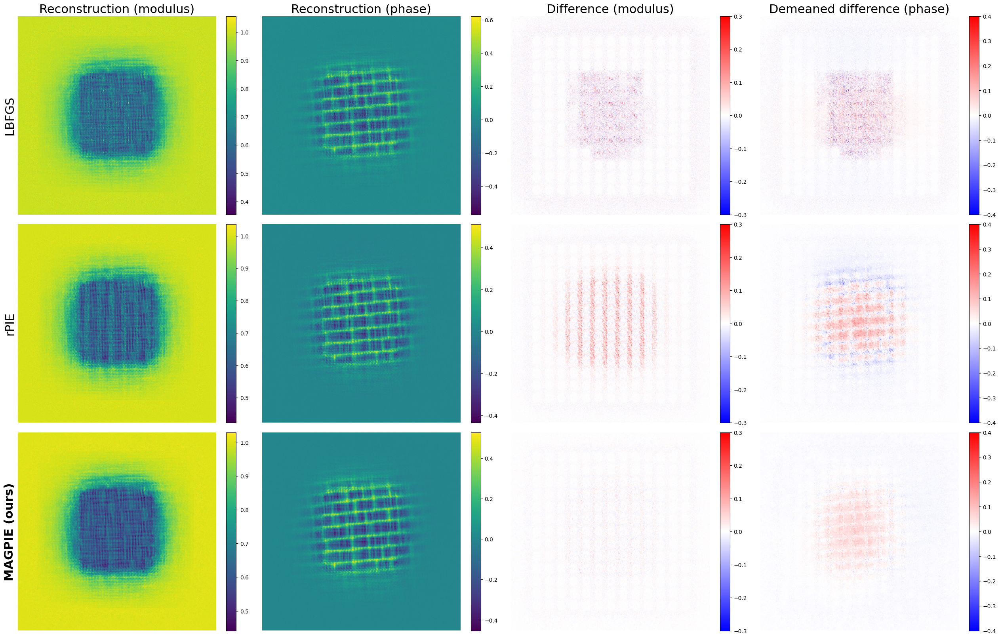

In [17]:
size = object_shape
rPIE_image = z_recon_rPIE_o75
MGrPIE_image = z_recon_MAGPIE_o75
LBFGS_image = zstar_o75.view(np.complex128).reshape(object_shape)
ground_truth = ground_truth

intensity_ground_truth = np.abs(ground_truth)
phase_ground_truth = np.angle(ground_truth)

def calculate_difference(image, ground_truth):
    intensity_diff = np.abs(image) - intensity_ground_truth
    phase_diff = np.angle(image) - phase_ground_truth - np.mean(np.angle(image) - phase_ground_truth)
    return intensity_diff, phase_diff

intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
intensity_MGrPIE, phase_MGrPIE = np.abs(MGrPIE_image), np.angle(MGrPIE_image)

# Calculate differences
intensity_diff_LBFGS, phase_diff_LBFGS = calculate_difference(LBFGS_image, ground_truth)
intensity_diff_rPIE, phase_diff_rPIE = calculate_difference(rPIE_image, ground_truth)
intensity_diff_MGrPIE, phase_diff_MGrPIE = calculate_difference(MGrPIE_image, ground_truth)

# Updated column titles and row labels
column_titles = [
    "Reconstruction (modulus)", 
    "Reconstruction (phase)", 
    "Difference (modulus)", 
    "Demeaned difference (phase)"
]
row_labels = ["LBFGS", "rPIE", "MAGPIE (ours)"]

# Prepare data for plotting: each tuple contains (intensity, phase, intensity_diff, phase_diff)
image_data = [
    (intensity_LBFGS, phase_LBFGS, intensity_diff_LBFGS, phase_diff_LBFGS),
    (intensity_rPIE, phase_rPIE, intensity_diff_rPIE, phase_diff_rPIE),
    (intensity_MGrPIE, phase_MGrPIE, intensity_diff_MGrPIE, phase_diff_MGrPIE),
]

# Create a new figure using subplots (no gridspec needed)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 16), constrained_layout=True)

# Set column titles on the first row.
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=22)

# Loop over each row of image data.
for i, (intensity, phase, intensity_diff, phase_diff) in enumerate(image_data):
    # Set the row label for the first column.
    if i == 2:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22, fontweight='bold')
    else:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22)

    # Remove spines and ticks for clarity.
    for j in range(4):
        ax = axes[i, j]
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Plot the intensity image.
    im0 = axes[i, 0].imshow(intensity, cmap='viridis')
    fig.colorbar(im0, ax=axes[i, 0])

    # Plot the phase image.
    im1 = axes[i, 1].imshow(phase, cmap='viridis')
    fig.colorbar(im1, ax=axes[i, 1])
    
    # Plot the intensity difference image with symmetric scaling.
    max_intensity_diff = np.max(np.abs(intensity_diff))
    im2 = axes[i, 2].imshow(intensity_diff, cmap='bwr', vmin=-0.3, vmax=0.3)
    fig.colorbar(im2, ax=axes[i, 2])

    # Plot the phase difference image with symmetric scaling.
    max_phase_diff = np.max(np.abs(phase_diff))
    im3 = axes[i, 3].imshow(phase_diff, cmap='bwr', vmin=-0.4, vmax=0.4)
    fig.colorbar(im3, ax=axes[i, 3])

plt.savefig('reconstruction_4_75.png', dpi=60, bbox_inches='tight')
plt.show()